## Introduction
- 对样本数量图片缺失、标签分布等信息做统计，对样本质量做检查，如能否检测到序列帧中人脸、68个特征点。经过初步的对样本数量和质量的检查，可以得到一份清洗过的数据集，以保证这些样本都是有效的。
- 得到清洗后的数据集后，可以对它们进行一些数据的统计，如样本标签分布、视频帧长度分布等

## SMIC-HS-E


In [1]:
from merlib.data.base import SMICHSE_info
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path,PurePath

### 转化为标准dataframe对象

通过观察可以发现数据存在一些冗余的列，尾部存在一些冗余行，且某些应该为Int类型的变量因为该列存在NaN值，因此为float

In [2]:
smic_hs_e=SMICHSE_info()
doc_path=smic_hs_e.doc_path
smic_hs_e_dataframe = pd.read_excel(doc_path)
smic_hs_e_dataframe


,Subject,Filename,Unnamed: 2,OnsetF,OffsetF,Onset2F,Offset2F,Onset3F,Offset3F,Unnamed: 9,FirstF,LastF,TotalMF1,TotalMF2,TotalMF3,TotalVL,Emotion,Note
0,20,s20_ne_01,NaN,17581039.0,17581055.0,NaN,NaN,NaN,NaN,NaN,17580887.0,17581094.0,17.0,NaN,NaN,208.0,negative,NaN
1,20,s20_ne_02,NaN,17581713.0,17581744.0,NaN,NaN,NaN,NaN,NaN,17581637.0,17582436.0,32.0,NaN,NaN,800.0,negative,NaN
2,20,s20_ne_03,NaN,17625391.0,17625424.0,NaN,NaN,NaN,NaN,NaN,17625259.0,17625458.0,34.0,NaN,NaN,200.0,negative,NaN
3,20,s20_ne_04,NaN,17651135.0,17651157.0,NaN,NaN,NaN,NaN,NaN,17651007.0,17651806.0,23.0,NaN,NaN,800.0,negative,NaN
4,20,s20_ne_05,NaN,17664393.0,17664423.0,NaN,NaN,NaN,NaN,NaN,17664257.0,17664656.0,31.0,NaN,NaN,400.0,negative,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
160,* The original SMIC-HS has 164 ME samples.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
161,"*According to our TAC paper, the SMIC-E-HS the...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
smic_hs_e_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Subject     160 non-null    object 
 1   Filename    157 non-null    object 
 2   Unnamed: 2  0 non-null      float64
 3   OnsetF      157 non-null    float64
 4   OffsetF     157 non-null    float64
 5   Onset2F     8 non-null      float64
 6   Offset2F    8 non-null      float64
 7   Onset3F     1 non-null      float64
 8   Offset3F    1 non-null      float64
 9   Unnamed: 9  0 non-null      float64
 10  FirstF      157 non-null    float64
 11  LastF       157 non-null    float64
 12  TotalMF1    157 non-null    float64
 13  TotalMF2    8 non-null      float64
 14  TotalMF3    1 non-null      float64
 15  TotalVL     157 non-null    float64
 16  Emotion     157 non-null    object 
 17  Note        8 non-null      object 
dtypes: float64(14), object(4)
memory usage: 23.0+ KB


原数据中每行可能有多个微表情，为了方便接下来的dataset进行数据读取，将它们单独成行

In [4]:
one_in_row_doc_dataframe:pd.DataFrame=pd.DataFrame({
    'Subject':[], 'Filename':[], 'OnsetF':[],'OffsetF':[],
    'TotalMF':[],'Emotion':[],
    'FirstF':[],'LastF':[],'TotalVL':[] # 该微表情所在的长视频的起点、终点帧，及总帧数
})

for index, row in smic_hs_e_dataframe.iterrows():
    new_rows=[]
    if not pd.isna(row['TotalMF1']):
        new_row1 = {
        'Subject':row['Subject'], 'Filename':row['Filename'], 'OnsetF':row['OnsetF'],'OffsetF':row['OffsetF'],
        'TotalMF':row['TotalMF1'],'Emotion':row['Emotion'],
        'FirstF':row['FirstF'],'LastF':row['LastF'],'TotalVL':row['TotalVL']
        }
        new_rows.append(new_row1)

    if not pd.isna(row['TotalMF2']):
        new_row2 = {
        'Subject':row['Subject'], 'Filename':row['Filename'], 'OnsetF':row['Onset2F'],'OffsetF':row['Offset2F'],
        'TotalMF':row['TotalMF2'],'Emotion':row['Emotion'],
        'FirstF':row['FirstF'],'LastF':row['LastF'],'TotalVL':row['TotalVL']
        }
        new_rows.append(new_row2)

    if not pd.isna(row['TotalMF3']):
        new_row3 = {
        'Subject':row['Subject'], 'Filename':row['Filename'], 'OnsetF':row['Onset3F'],'OffsetF':row['Offset3F'],
        'TotalMF':row['TotalMF3'],'Emotion':row['Emotion'],
        'FirstF':row['FirstF'],'LastF':row['LastF'],'TotalVL':row['TotalVL']
        }
        new_rows.append(new_row3)
    one_in_row_doc_dataframe = pd.concat([one_in_row_doc_dataframe, pd.DataFrame(new_rows)], axis=0, ignore_index=True)

one_in_row_doc_dataframe['Subject'] =one_in_row_doc_dataframe['Subject'].astype(int).astype(str)
one_in_row_doc_dataframe[['Filename','Emotion']]=one_in_row_doc_dataframe[['Filename','Emotion']].astype(str)
one_in_row_doc_dataframe[['OnsetF', 'OffsetF','TotalMF',
                          'FirstF','LastF','TotalVL']] = one_in_row_doc_dataframe[['OnsetF', 'OffsetF','TotalMF','FirstF','LastF','TotalVL']].astype(int)

one_in_row_doc_dataframe

,Subject,Filename,OnsetF,OffsetF,TotalMF,Emotion,FirstF,LastF,TotalVL
0,20,s20_ne_01,17581039,17581055,17,negative,17580887,17581094,208
1,20,s20_ne_02,17581713,17581744,32,negative,17581637,17582436,800
2,20,s20_ne_03,17625391,17625424,34,negative,17625259,17625458,200
3,20,s20_ne_04,17651135,17651157,23,negative,17651007,17651806,800
4,20,s20_ne_05,17664393,17664423,31,negative,17664257,17664656,400
...,...,...,...,...,...,...,...,...,...
161,8,s8_po_04,406204,406244,41,positive,405900,406399,500
162,9,s9_po_01,72643,72684,42,positive,72300,72999,700
163,9,s9_sur_01,61206,61232,27,surprise,60900,61499,600
164,9,s9_sur_01,61250,61291,42,surprise,60900,61499,600


In [5]:
one_in_row_doc_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166 entries, 0 to 165
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Subject   166 non-null    object
 1   Filename  166 non-null    object
 2   OnsetF    166 non-null    int64 
 3   OffsetF   166 non-null    int64 
 4   TotalMF   166 non-null    int64 
 5   Emotion   166 non-null    object
 6   FirstF    166 non-null    int64 
 7   LastF     166 non-null    int64 
 8   TotalVL   166 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 11.8+ KB


经过处理数据格式合理，且每个样本单独成行。同样为了dataset的一致性处理数据集，我们需要将one_in_row_doc_dataframe处理得到标准的微表情df对象

In [6]:
from data.clean_doc import make_dataframe

from pathlib import PurePath
path= one_in_row_doc_dataframe['Subject'].apply(lambda x: 's{:02d}'.format(int(x)) ).apply(lambda x: PurePath(x) )
path=path  / one_in_row_doc_dataframe['Filename']
apex_frame=(one_in_row_doc_dataframe['OnsetF']+one_in_row_doc_dataframe['OffsetF'])//2
smic_hs_e_standard_df_v1=make_dataframe(path=path,
                           start_frame=one_in_row_doc_dataframe['OnsetF'],
                           apex_frame=apex_frame,
                           end_frame=one_in_row_doc_dataframe['OffsetF'],
                            emotion_label=one_in_row_doc_dataframe['Emotion'],
                            group=one_in_row_doc_dataframe['Subject']
                           )

smic_hs_e_standard_df_v1

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,s20/s20_ne_01,s20/s20_ne_01/17581039_17581055,17581039,17581047,17581055,negative,20
1,s20/s20_ne_02,s20/s20_ne_02/17581713_17581744,17581713,17581728,17581744,negative,20
2,s20/s20_ne_03,s20/s20_ne_03/17625391_17625424,17625391,17625407,17625424,negative,20
3,s20/s20_ne_04,s20/s20_ne_04/17651135_17651157,17651135,17651146,17651157,negative,20
4,s20/s20_ne_05,s20/s20_ne_05/17664393_17664423,17664393,17664408,17664423,negative,20
...,...,...,...,...,...,...,...
161,s08/s8_po_04,s08/s8_po_04/406204_406244,406204,406224,406244,positive,8
162,s09/s9_po_01,s09/s9_po_01/72643_72684,72643,72663,72684,positive,9
163,s09/s9_sur_01,s09/s9_sur_01/61206_61232,61206,61219,61232,surprise,9
164,s09/s9_sur_01,s09/s9_sur_01/61250_61291,61250,61270,61291,surprise,9


### 检查标注错误

#### 检查标签信息

<AxesSubplot:>

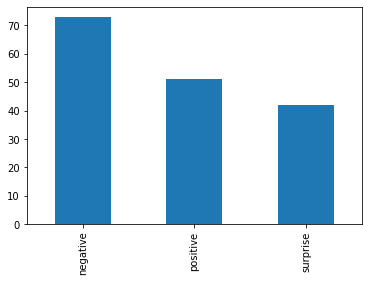

In [9]:
smic_hs_e_standard_df_v1['emotion_label'].value_counts().plot.bar()

#### 检查 onset apex offset 顺序

In [7]:
from data.utils import check_onset_apex_offset_order

doc=smic_hs_e_standard_df_v1
flag,_=check_onset_apex_offset_order(doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame)


Every thing is ok!


### 样本数量检查

In [10]:
from data.utils import check_sample_lacks
doc=smic_hs_e_standard_df_v1
imagefile_template=smic_hs_e.imagefile_template
raw_data_dir=smic_hs_e.raw_data_path
video_paths=raw_data_dir / doc['path']

check_sample_lacks(video_paths,doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame,imagefile_template)

everything is ok


,,onset,apex,offset,duration,real_duration,lack_rate,lack_img_id
video_path,clip_id,,,,,,,


### 样本质量检查
能否发现人脸及人脸68个特征点

In [11]:
import openface
from data import DLIB_FACE_LANDMARK_PATH
align=openface.AlignDlib(DLIB_FACE_LANDMARK_PATH)

doc=smic_hs_e_standard_df_v1
imagefile_template=smic_hs_e.imagefile_template
raw_data_dir=smic_hs_e.raw_data_path
video_paths=raw_data_dir / doc['path']
for video_path,start,end in zip(video_paths, doc['start_frame'],doc['end_frame']):
    img_path:Path=video_path/ imagefile_template.format(start)
    np_img=np.array(Image.open(img_path))

    bbox=align.getLargestFaceBoundingBox(np_img)
    assert bbox is not None
    landmarks=align.findLandmarks(np_img,bbox)
    assert len(landmarks) ==68

### 统计

#### 视频帧信息及可视化

Image size:1种，{(640, 480)}
Image mode:1种，{'RGB'}
Image format:1种，{'JPEG'}


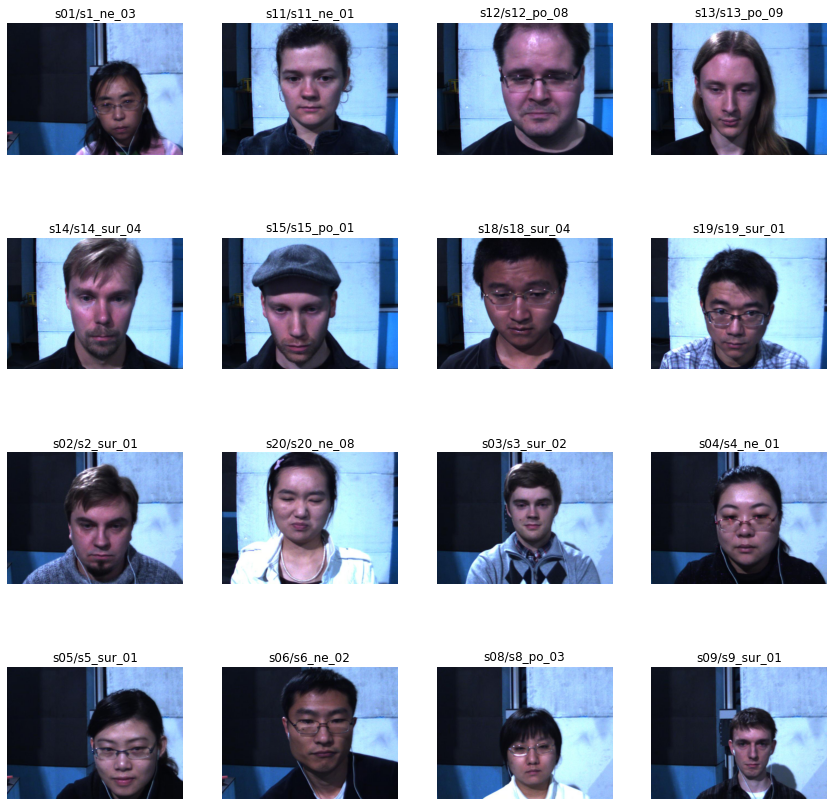

In [13]:
from data.utils import random_read_img_in_seq,plot_images,get_images_info
res,names=random_read_img_in_seq(smic_hs_e_standard_df_v1,smic_hs_e)
imgs=[Image.open(x) for x in res]
get_images_info(imgs)
plot_images(imgs,cols=4,titles=names)

#### 样本标签分布


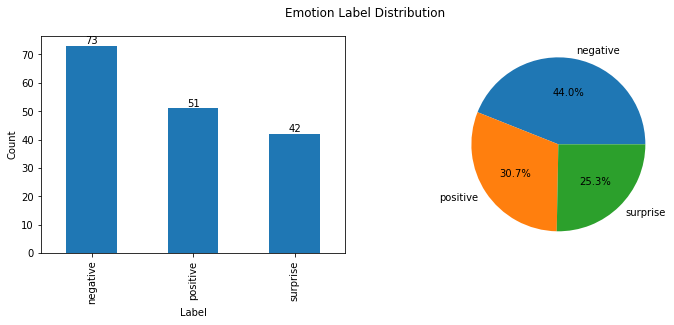

In [15]:
from data.utils import show_label_distribution,show_duration_len
# show_label_distribution(standard_df)
show_label_distribution(smic_hs_e_standard_df_v1)

### 样本帧数量分布


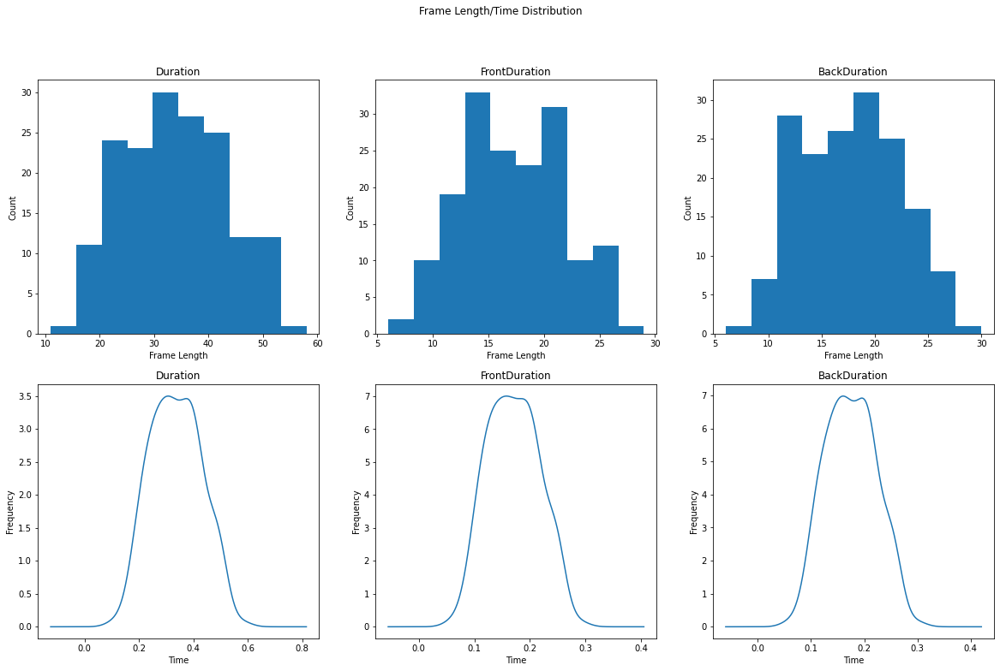

In [18]:
show_duration_len(smic_hs_e_standard_df_v1,100 or smic_hs_e.fps )

## CASME2

In [1]:
from merlib.data.base import CASME2_info
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path,PurePath

### 转化成standard_df对象

In [2]:
casme2_info=CASME2_info()
doc_path=casme2_info.doc_path
casme2_dataframe = pd.read_excel(doc_path)
print(casme2_dataframe.info())
casme2_dataframe


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255 entries, 0 to 254
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Subject            255 non-null    int64  
 1   Filename           255 non-null    object 
 2   Unnamed: 2         0 non-null      float64
 3   OnsetFrame         255 non-null    int64  
 4   ApexFrame          255 non-null    object 
 5   OffsetFrame        255 non-null    int64  
 6   Unnamed: 6         0 non-null      float64
 7   Action Units       255 non-null    object 
 8   Estimated Emotion  255 non-null    object 
dtypes: float64(2), int64(3), object(4)
memory usage: 18.1+ KB
None


,Subject,Filename,Unnamed: 2,OnsetFrame,ApexFrame,OffsetFrame,Unnamed: 6,Action Units,Estimated Emotion
0,1,EP02_01f,NaN,46,59,86,NaN,12,happiness
1,1,EP03_02,NaN,131,139,161,NaN,18,others
2,1,EP04_02,NaN,21,54,76,NaN,4,others
3,1,EP04_03,NaN,31,41,56,NaN,4,others
4,1,EP04_04,NaN,23,49,66,NaN,4,others
...,...,...,...,...,...,...,...,...,...
250,26,EP18_46,NaN,31,46,101,NaN,16,others
251,26,EP18_47,NaN,6,49,86,NaN,4,disgust
252,26,EP18_49,NaN,16,54,80,NaN,4,disgust
253,26,EP18_50,NaN,78,99,161,NaN,4,disgust


In [3]:
from data.clean_doc import make_dataframe

from pathlib import PurePath

doc=casme2_dataframe
video_path=PurePath()/ doc['Subject'].map(lambda x: 'sub{:02d}'.format(x)) /doc['Filename']
casme2_standard_df_v1=make_dataframe(
        path=video_path,
        start_frame=doc['OnsetFrame'],
        apex_frame=doc['ApexFrame'],
        end_frame=doc['OffsetFrame'],
        emotion_label=doc['Estimated Emotion'],
        group=doc['Subject'].astype(str),
        )

# assert (casme2_standard_df_v1.apex_frame<=casme2_standard_df_v1.end_frame).all() and (casme2_standard_df_v1.apex_frame>=casme2_standard_df_v1.start_frame).all()
print(casme2_standard_df_v1.info())
casme2_standard_df_v1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255 entries, 0 to 254
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           255 non-null    object
 1   unique_path    255 non-null    object
 2   start_frame    255 non-null    int64 
 3   apex_frame     255 non-null    object
 4   end_frame      255 non-null    int64 
 5   emotion_label  255 non-null    object
 6   group          255 non-null    object
dtypes: int64(2), object(5)
memory usage: 14.1+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,sub01/EP02_01f,sub01/EP02_01f/46_86,46,59,86,happiness,1
1,sub01/EP03_02,sub01/EP03_02/131_161,131,139,161,others,1
2,sub01/EP04_02,sub01/EP04_02/21_76,21,54,76,others,1
3,sub01/EP04_03,sub01/EP04_03/31_56,31,41,56,others,1
4,sub01/EP04_04,sub01/EP04_04/23_66,23,49,66,others,1
...,...,...,...,...,...,...,...
250,sub26/EP18_46,sub26/EP18_46/31_101,31,46,101,others,26
251,sub26/EP18_47,sub26/EP18_47/6_86,6,49,86,disgust,26
252,sub26/EP18_49,sub26/EP18_49/16_80,16,54,80,disgust,26
253,sub26/EP18_50,sub26/EP18_50/78_161,78,99,161,disgust,26


apex帧类型不正确，运行类型转化代码报错 存在字符'/'不能被int转化，这里进行处理，取中间帧代替

In [4]:
# processed_casme2_dataframe=processed_casme2_dataframe['ApexFrame'].astype(int) 报错
selected_rows=casme2_standard_df_v1[casme2_standard_df_v1.apex_frame == "/"]
selected_rows

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
29,sub04/EP12_01f,sub04/EP12_01f/261_321,261,/,321,disgust,4


In [5]:
casme2_standard_df_v2=casme2_standard_df_v1.copy()
casme2_standard_df_v2.loc[selected_rows.index, 'apex_frame'] = (casme2_standard_df_v2.loc[selected_rows.index, 'start_frame'] + casme2_standard_df_v2.loc[selected_rows.index, 'end_frame'])//2

casme2_standard_df_v2['apex_frame'] = casme2_standard_df_v2['apex_frame'].astype(np.int64)
casme2_standard_df_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255 entries, 0 to 254
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           255 non-null    object
 1   unique_path    255 non-null    object
 2   start_frame    255 non-null    int64 
 3   apex_frame     255 non-null    int64 
 4   end_frame      255 non-null    int64 
 5   emotion_label  255 non-null    object
 6   group          255 non-null    object
dtypes: int64(3), object(4)
memory usage: 14.1+ KB


### 检查标注错误

#### 检查标签信息
检查标签信息是否和论文对应，发现相比论文，其多出sadness,fear等类，然而这些类又不被现在的微表情识别论文所采用

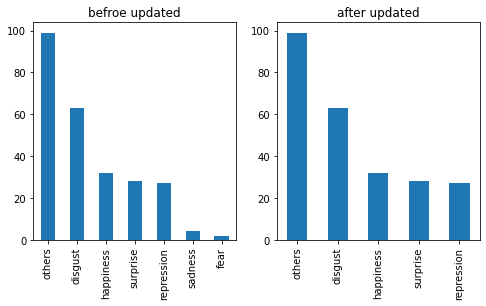

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,sub01/EP02_01f,sub01/EP02_01f/46_86,46,59,86,happiness,1
1,sub01/EP03_02,sub01/EP03_02/131_161,131,139,161,others,1
2,sub01/EP04_02,sub01/EP04_02/21_76,21,54,76,others,1
3,sub01/EP04_03,sub01/EP04_03/31_56,31,41,56,others,1
4,sub01/EP04_04,sub01/EP04_04/23_66,23,49,66,others,1
...,...,...,...,...,...,...,...
244,sub26/EP18_46,sub26/EP18_46/31_101,31,46,101,others,26
245,sub26/EP18_47,sub26/EP18_47/6_86,6,49,86,disgust,26
246,sub26/EP18_49,sub26/EP18_49/16_80,16,54,80,disgust,26
247,sub26/EP18_50,sub26/EP18_50/78_161,78,99,161,disgust,26


In [6]:
_,ax=plt.subplots(1,2,figsize=(8,4)) #figsize 的默认值是 (6.4, 4.8)，其中第一个数是宽度，第二个数是高度，单位是英寸。
casme2_standard_df_v2['emotion_label'].value_counts().plot.bar(ax=ax[0])

casme2_standard_df_v3=casme2_standard_df_v2.copy()
casme2_standard_df_v3=casme2_standard_df_v3[~casme2_standard_df_v3['emotion_label'].isin(['sadness','fear'])].reset_index(drop=True)

casme2_standard_df_v3['emotion_label'].value_counts().plot.bar(ax=ax[1])
ax[0].set_title('befroe updated')
ax[1].set_title('after updated')
plt.show()
casme2_standard_df_v3

#### 检查Onset、Apex、Offset帧标注

In [7]:
from data.utils import check_onset_apex_offset_order
doc=casme2_standard_df_v3
flag,_=check_onset_apex_offset_order(doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame)

Every thing is ok!


### 样本数量检查
检查标注的微表情序列，每个序列缺失的帧数

In [8]:
from pathlib import Path
from tqdm import tqdm
from data.utils import check_sample_lacks

imagefile_template=casme2_info.imagefile_template
raw_data_dir=casme2_info.raw_data_path
video_paths=raw_data_dir / doc['path']

check_sample_lacks(video_paths,doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame,imagefile_template)

everything is ok


,,onset,apex,offset,duration,real_duration,lack_rate,lack_img_id
video_path,clip_id,,,,,,,


### 样本质量检查

能否发现人脸及人脸68个特征点

In [24]:
import openface
from data import DLIB_FACE_LANDMARK_PATH
from PIL import Image
import numpy as np
def check_faces_is_detected(video_paths,clip_ids,onsets,offsets,imagefile_template):
    align=openface.AlignDlib(DLIB_FACE_LANDMARK_PATH)
    return_flag = True
    for video_path,unipath,start,end in zip(video_paths,clip_ids , onsets,offsets):
        img_path:Path=video_path/ imagefile_template.format(start)
        if not img_path.exists(): continue
        np_img=np.array(Image.open(img_path))

        bbox=align.getLargestFaceBoundingBox(np_img)
        if  bbox is  None:
            print('bbox is None:',unipath)
            return_flag=False
            continue
        landmarks=align.findLandmarks(np_img,bbox)
        if  len(landmarks) !=68:
            print('(landmarks) !=68:',unipath)
            return_flag=False
    if return_flag:
        print("Every thing is ok!")
    return return_flag

doc=casme2_standard_df_v3
data_info=casme2_info

raw_data_dir=data_info.raw_data_path
imagefile_template=data_info.imagefile_template

video_paths=raw_data_dir / doc['path']
check_faces_is_detected(video_paths,doc.unique_path ,doc.start_frame,doc.end_frame,imagefile_template)

Every thing is ok!


True

### 统计

In [9]:
standard_df=casme2_standard_df_v3
standard_df

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,sub01/EP02_01f,sub01/EP02_01f/46_86,46,59,86,happiness,1
1,sub01/EP03_02,sub01/EP03_02/131_161,131,139,161,others,1
2,sub01/EP04_02,sub01/EP04_02/21_76,21,54,76,others,1
3,sub01/EP04_03,sub01/EP04_03/31_56,31,41,56,others,1
4,sub01/EP04_04,sub01/EP04_04/23_66,23,49,66,others,1
...,...,...,...,...,...,...,...
244,sub26/EP18_46,sub26/EP18_46/31_101,31,46,101,others,26
245,sub26/EP18_47,sub26/EP18_47/6_86,6,49,86,disgust,26
246,sub26/EP18_49,sub26/EP18_49/16_80,16,54,80,disgust,26
247,sub26/EP18_50,sub26/EP18_50/78_161,78,99,161,disgust,26


In [10]:
from data.clean_doc import process_CASME2
doc=process_CASME2(casme2_info.doc_path)
assert doc.equals(standard_df)

True

视频帧信息及可视化

Image size:1种，{(640, 480)}
Image mode:1种，{'RGB'}
Image format:1种，{'JPEG'}


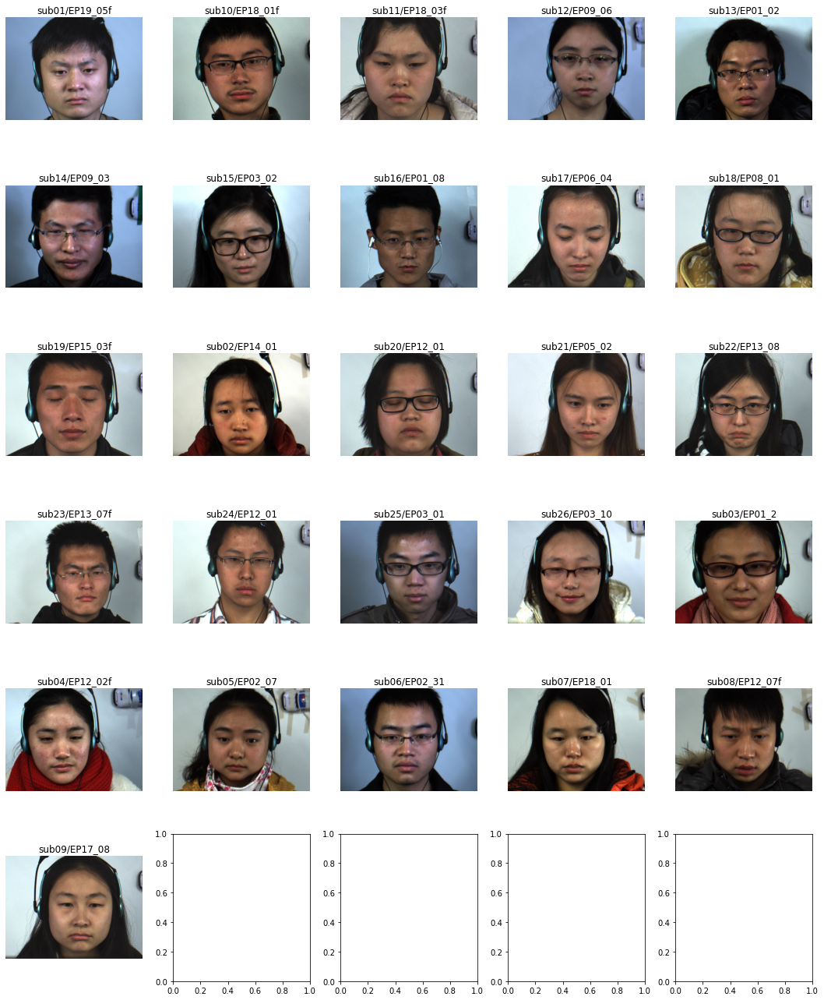

In [11]:
from data.utils import get_images_info,random_read_img_in_seq,plot_images
res,names=random_read_img_in_seq(standard_df,casme2_info)
imgs=[Image.open(x) for x in res]
get_images_info(imgs)
plot_images(imgs,cols=5,titles=names)


#### 样本标签分布


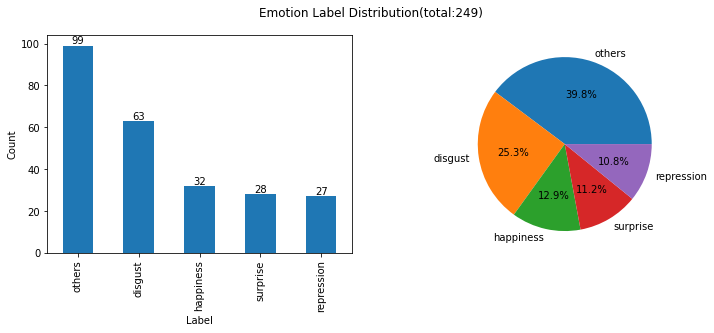

In [12]:
from data.utils import show_label_distribution,show_duration_len
# show_label_distribution(standard_df)
show_label_distribution(standard_df)

#### 样本帧数量分布

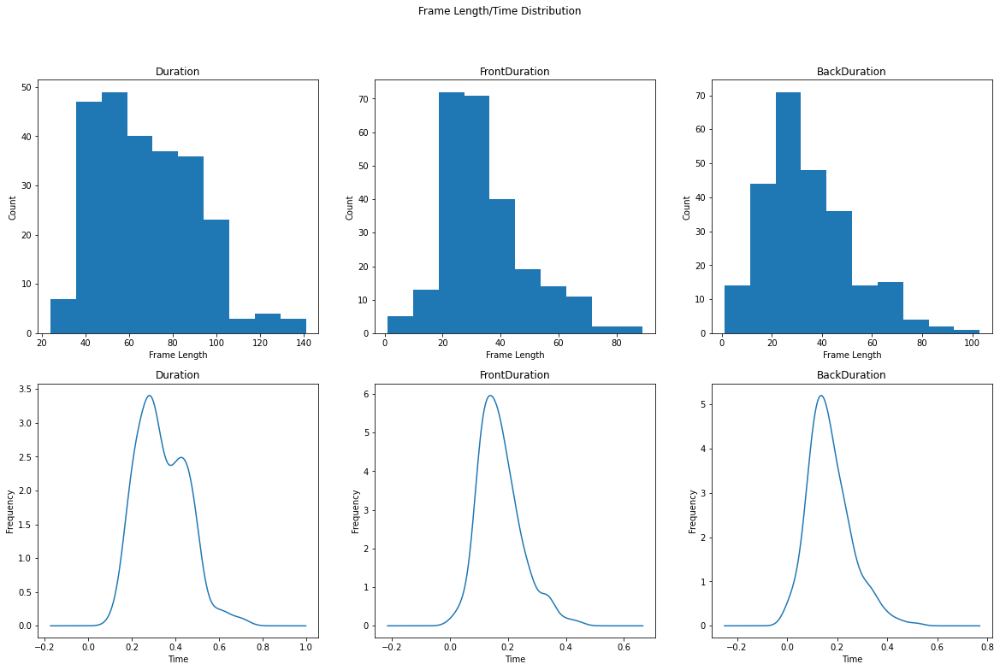

In [13]:
show_duration_len(standard_df,casme2_info.fps)

## SAMM

In [14]:
from data.base import SAMM_info
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path,PurePath

### 处理得到标准standard_df对象

通过观察可以发现数据存在一些冗余的列Inducement Code,Micro,Notes等，数据类型比较正确，然而有Apex帧标注错误需要处理

In [15]:
samm_info=SAMM_info()
doc_path=samm_info.doc_path
samm_dataframe = pd.read_excel(doc_path,header=13)
print(samm_dataframe.info())
samm_dataframe


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Subject            159 non-null    int64 
 1   Filename           159 non-null    object
 2   Inducement Code    159 non-null    int64 
 3   Onset Frame        159 non-null    int64 
 4   Apex Frame         159 non-null    int64 
 5   Offset Frame       159 non-null    int64 
 6   Duration           159 non-null    int64 
 7   Micro              159 non-null    object
 8   Action Units       159 non-null    object
 9   Estimated Emotion  159 non-null    object
 10  Objective Classes  159 non-null    int64 
 11  Notes              61 non-null     object
dtypes: int64(7), object(5)
memory usage: 15.0+ KB
None


,Subject,Filename,Inducement Code,Onset Frame,Apex Frame,Offset Frame,Duration,Micro,Action Units,Estimated Emotion,Objective Classes,Notes
0,6,006_1_2,1,5562,5588,5632,71,Micro - 1/2,4+7,Anger,3,NaN
1,6,006_1_3,1,3912,3948,3988,77,Micro - 1/2,4,Anger,3,While blinking
2,6,006_1_4,1,2324,2368,2403,80,Micro - 1/2,4+7,Anger,3,NaN
3,6,006_1_5,1,5343,5388,5424,82,Micro - 1/2,4+7,Anger,3,NaN
4,6,006_1_6,1,7160,7197,7259,100,Micro - 1/2,4+7+43,Anger,7,Double AU4
...,...,...,...,...,...,...,...,...,...,...,...,...
154,35,035_7_2,7,823,855,918,96,Micro - 1/2,R14A or 17A or 24A,Contempt,7,NaN
155,36,036_7_3,7,2264,2339,2363,100,Micro - 1/2,R10A+25+26,Disgust,4,Stays with 25+26 and eye movement
156,37,037_3_1,3,3306,3342,3382,77,Micro - 1/2,24,Other,7,NaN
157,37,037_3_2,3,3196,3214,3295,100,Micro - 1/2,T23,Anger,3,NaN


In [16]:
doc=samm_dataframe
video_paths = PurePath() / doc['Subject'].map(lambda x: '{:03d}'.format(x)) / doc['Filename']

samm_standard_df_v1=make_dataframe(
        path=video_paths,
        start_frame=doc['Onset Frame'],
        apex_frame=doc['Apex Frame'],
        end_frame=doc['Offset Frame'],
        emotion_label=doc['Estimated Emotion'],
        group=doc['Subject'].astype(str))
print(samm_standard_df_v1.info())
samm_standard_df_v1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           159 non-null    object
 1   unique_path    159 non-null    object
 2   start_frame    159 non-null    int64 
 3   apex_frame     159 non-null    int64 
 4   end_frame      159 non-null    int64 
 5   emotion_label  159 non-null    object
 6   group          159 non-null    object
dtypes: int64(3), object(4)
memory usage: 8.8+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,006/006_1_2,006/006_1_2/5562_5632,5562,5588,5632,Anger,6
1,006/006_1_3,006/006_1_3/3912_3988,3912,3948,3988,Anger,6
2,006/006_1_4,006/006_1_4/2324_2403,2324,2368,2403,Anger,6
3,006/006_1_5,006/006_1_5/5343_5424,5343,5388,5424,Anger,6
4,006/006_1_6,006/006_1_6/7160_7259,7160,7197,7259,Anger,6
...,...,...,...,...,...,...,...
154,035/035_7_2,035/035_7_2/823_918,823,855,918,Contempt,35
155,036/036_7_3,036/036_7_3/2264_2363,2264,2339,2363,Disgust,36
156,037/037_3_1,037/037_3_1/3306_3382,3306,3342,3382,Other,37
157,037/037_3_2,037/037_3_2/3196_3295,3196,3214,3295,Anger,37


###  检查标注错误

#### 检查标签信息

<AxesSubplot:>

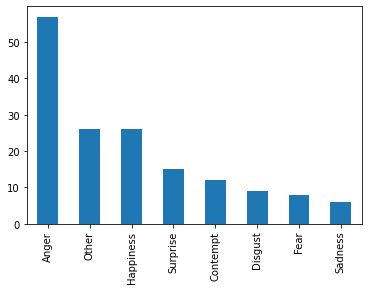

In [17]:
samm_standard_df_v1.emotion_label.value_counts().plot.bar()

#### 检查onset,apex,offset标注顺序

In [18]:
from data.utils import check_onset_apex_offset_order
doc=samm_standard_df_v1
flag,error_clip_id=check_onset_apex_offset_order(doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame)

028/028_4_1/1071_1134 apex-1143 is not in [1071,1134]
032/032_3_1/4896_4970 apex-1930 is not in [4896,4970]


In [19]:
# 观察 两个序列分别是60帧 80帧，取中间值做中间帧
selected_rows=samm_standard_df_v1.unique_path.isin(error_clip_id)
samm_standard_df_v1[selected_rows]

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
125,028/028_4_1,028/028_4_1/1071_1134,1071,1143,1134,Contempt,28
132,032/032_3_1,032/032_3_1/4896_4970,4896,1930,4970,Anger,32


In [20]:
from data.clean_doc import make_dataframe

from pathlib import PurePath

samm_standard_df_v2=samm_standard_df_v1.copy()
samm_standard_df_v2.loc[selected_rows, 'apex_frame'] = (samm_standard_df_v2.loc[selected_rows, 'start_frame'] + samm_standard_df_v2.loc[selected_rows, 'end_frame']) // 2

assert (samm_standard_df_v2.apex_frame<=samm_standard_df_v2.end_frame).all() and (samm_standard_df_v2.apex_frame>samm_standard_df_v2.start_frame).all()
print(samm_standard_df_v2.info())
samm_standard_df_v2

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           159 non-null    object
 1   unique_path    159 non-null    object
 2   start_frame    159 non-null    int64 
 3   apex_frame     159 non-null    int64 
 4   end_frame      159 non-null    int64 
 5   emotion_label  159 non-null    object
 6   group          159 non-null    object
dtypes: int64(3), object(4)
memory usage: 8.8+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,006/006_1_2,006/006_1_2/5562_5632,5562,5588,5632,Anger,6
1,006/006_1_3,006/006_1_3/3912_3988,3912,3948,3988,Anger,6
2,006/006_1_4,006/006_1_4/2324_2403,2324,2368,2403,Anger,6
3,006/006_1_5,006/006_1_5/5343_5424,5343,5388,5424,Anger,6
4,006/006_1_6,006/006_1_6/7160_7259,7160,7197,7259,Anger,6
...,...,...,...,...,...,...,...
154,035/035_7_2,035/035_7_2/823_918,823,855,918,Contempt,35
155,036/036_7_3,036/036_7_3/2264_2363,2264,2339,2363,Disgust,36
156,037/037_3_1,037/037_3_1/3306_3382,3306,3342,3382,Other,37
157,037/037_3_2,037/037_3_2/3196_3295,3196,3214,3295,Anger,37


### 样本数量检查
检查标注的微表情序列，每个序列缺失的帧数

In [21]:
from pathlib import Path
from tqdm import tqdm
from data.utils import check_sample_lacks

doc=samm_standard_df_v2
imagefile_template=samm_info.imagefile_template
raw_data_dir=samm_info.raw_data_path
video_paths=raw_data_dir / doc['path']
check_sample_lacks(video_paths,doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame,imagefile_template)

everything is ok


,,onset,apex,offset,duration,real_duration,lack_rate,lack_img_id
video_path,clip_id,,,,,,,


### 样本质量检查

能否发现人脸及人脸68个特征点

In [37]:
import openface
from data import DLIB_FACE_LANDMARK_PATH
align=openface.AlignDlib(DLIB_FACE_LANDMARK_PATH)

doc=samm_standard_df_v2
imagefile_template=samm_info.imagefile_template
raw_data_dir=samm_info.raw_data_path
video_paths=raw_data_dir / doc['path']
for video_path,start,end in zip(video_paths, doc['start_frame'],doc['end_frame']):
    img_path:Path=video_path/ imagefile_template.format(start)
    np_img=np.array(Image.open(img_path))

    bbox=align.getLargestFaceBoundingBox(np_img)
    assert bbox is not None
    landmarks=align.findLandmarks(np_img,bbox)
    assert len(landmarks) ==68

### 统计

In [22]:
from data.clean_doc import process_SAMM
doc=process_SAMM(samm_info.doc_path)
assert doc.equals(samm_standard_df_v2)

True

In [23]:
standard_df=samm_standard_df_v2
print(standard_df.info())
standard_df


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           159 non-null    object
 1   unique_path    159 non-null    object
 2   start_frame    159 non-null    int64 
 3   apex_frame     159 non-null    int64 
 4   end_frame      159 non-null    int64 
 5   emotion_label  159 non-null    object
 6   group          159 non-null    object
dtypes: int64(3), object(4)
memory usage: 8.8+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,006/006_1_2,006/006_1_2/5562_5632,5562,5588,5632,Anger,6
1,006/006_1_3,006/006_1_3/3912_3988,3912,3948,3988,Anger,6
2,006/006_1_4,006/006_1_4/2324_2403,2324,2368,2403,Anger,6
3,006/006_1_5,006/006_1_5/5343_5424,5343,5388,5424,Anger,6
4,006/006_1_6,006/006_1_6/7160_7259,7160,7197,7259,Anger,6
...,...,...,...,...,...,...,...
154,035/035_7_2,035/035_7_2/823_918,823,855,918,Contempt,35
155,036/036_7_3,036/036_7_3/2264_2363,2264,2339,2363,Disgust,36
156,037/037_3_1,037/037_3_1/3306_3382,3306,3342,3382,Other,37
157,037/037_3_2,037/037_3_2/3196_3295,3196,3214,3295,Anger,37


#### 视频帧信息及可视化
对每个对象进行可视化，每个对象随机选取一个序列，每个序列随机选取一张。

Image size:1种，{(960, 650)}
Image mode:1种，{'L'}
Image format:1种，{'JPEG'}


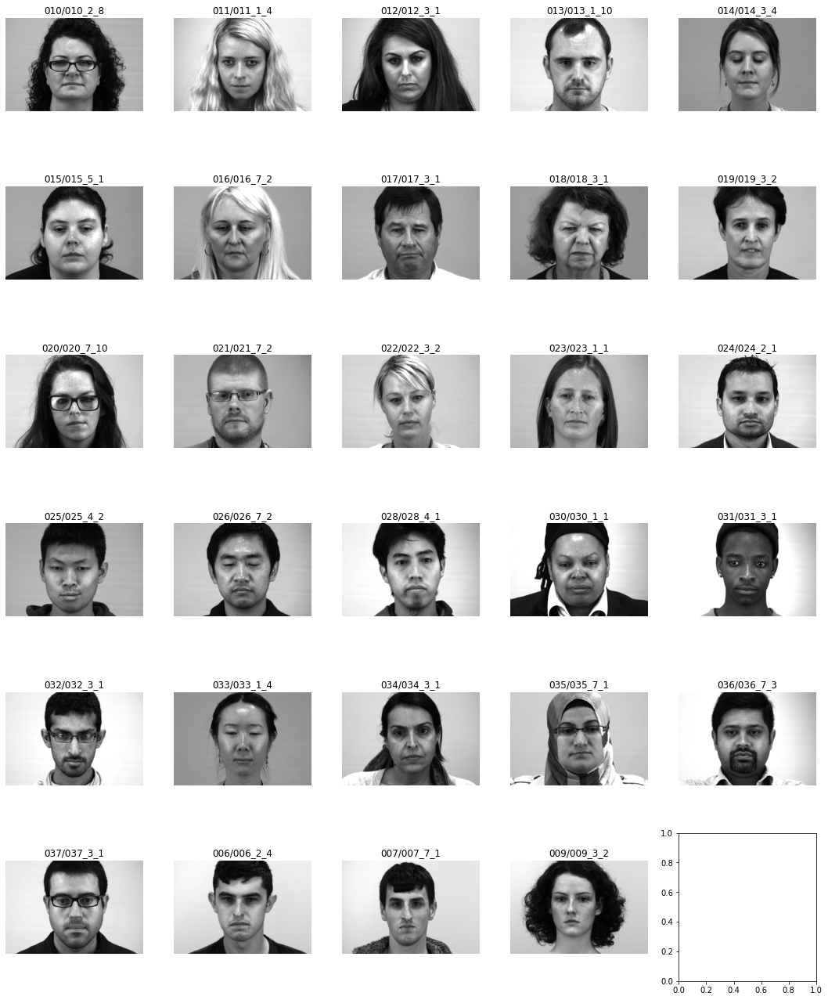

In [24]:
from data.utils import get_images_info,random_read_img_in_seq,plot_images

res,names=random_read_img_in_seq(standard_df,samm_info)
imgs=[Image.open(x) for x in res]
get_images_info(imgs)
plot_images(imgs,cols=5,titles=names)

#### 样本标签分布


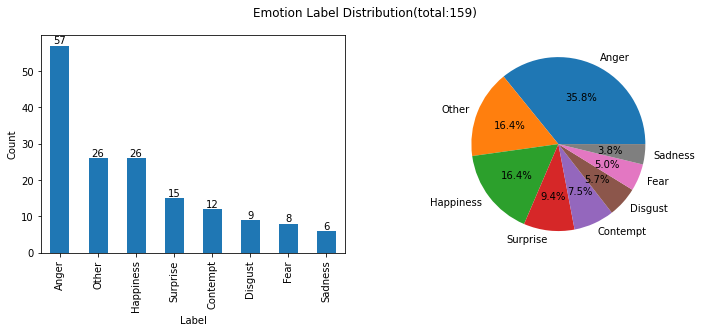

In [25]:
from data.utils import show_label_distribution,show_duration_len
# show_label_distribution(standard_df)
show_label_distribution(standard_df)

#### 样本帧数量分布

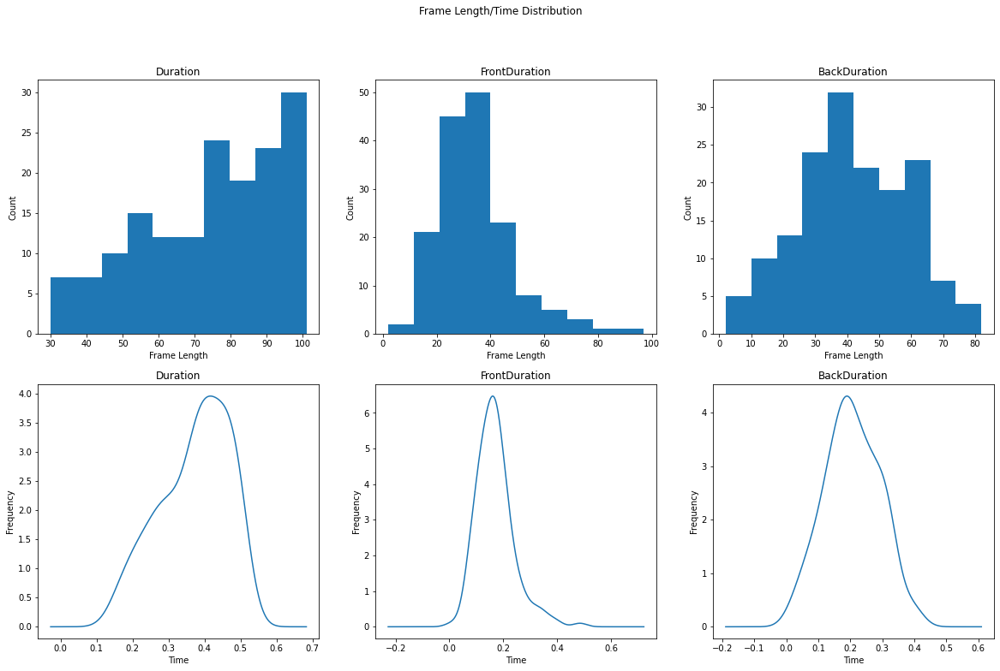

In [25]:
show_duration_len(standard_df,200 or samm_info.fps)

## MMEW

In [2]:
from merlib.data.base import MMEW_info
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path,PurePath

### 处理得到标准的standard_df对象

In [3]:
mmew_info=MMEW_info()
doc_path=mmew_info.doc_path
mmew_dataframe = pd.read_excel(doc_path)
print(mmew_dataframe.info())
mmew_dataframe


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Subject            300 non-null    int64  
 1   Filename           300 non-null    object 
 2   OnsetFrame         300 non-null    int64  
 3   ApexFrame          300 non-null    int64  
 4   OffsetFrame        300 non-null    int64  
 5   Action Units       300 non-null    object 
 6   Estimated Emotion  300 non-null    object 
 7   remarks            0 non-null      float64
dtypes: float64(1), int64(4), object(3)
memory usage: 18.9+ KB
None


,Subject,Filename,OnsetFrame,ApexFrame,OffsetFrame,Action Units,Estimated Emotion,remarks
0,1,S01-01-001,1,15,31,6+12,happiness,NaN
1,1,S01-01-002,1,15,45,12,happiness,NaN
2,1,S01-01-003,1,7,23,12,happiness,NaN
3,1,S01-02-001,1,17,39,5,surprise,NaN
4,1,S01-02-002,1,6,41,5,surprise,NaN
...,...,...,...,...,...,...,...,...
295,30,S30-04-004,1,13,31,4,others,NaN
296,30,S30-04-005,1,17,38,L4+15,others,NaN
297,30,S30-05-001,1,10,26,4+R20,fear,NaN
298,30,S30-06-001,1,27,41,17,sadness,NaN


In [4]:
from merlib.data.clean_doc import make_dataframe
doc=mmew_dataframe
video_paths = PurePath() / doc['Estimated Emotion'] / doc['Filename']
mmew_standard_df_v1= make_dataframe(
    path=video_paths,
    start_frame=doc['OnsetFrame'],
    apex_frame=doc['ApexFrame'],
    end_frame=doc['OffsetFrame'],
    emotion_label=doc['Estimated Emotion'],
    group=doc['Subject']
    )
mmew_standard_df_v1

,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,happiness/S01-01-001,happiness/S01-01-001/1_31,1,15,31,happiness,1
1,happiness/S01-01-002,happiness/S01-01-002/1_45,1,15,45,happiness,1
2,happiness/S01-01-003,happiness/S01-01-003/1_23,1,7,23,happiness,1
3,surprise/S01-02-001,surprise/S01-02-001/1_39,1,17,39,surprise,1
4,surprise/S01-02-002,surprise/S01-02-002/1_41,1,6,41,surprise,1
...,...,...,...,...,...,...,...
295,others/S30-04-004,others/S30-04-004/1_31,1,13,31,others,30
296,others/S30-04-005,others/S30-04-005/1_38,1,17,38,others,30
297,fear/S30-05-001,fear/S30-05-001/1_26,1,10,26,fear,30
298,sadness/S30-06-001,sadness/S30-06-001/1_41,1,27,41,sadness,30


###  检查标注错误

#### 检查标签信息

<AxesSubplot:>

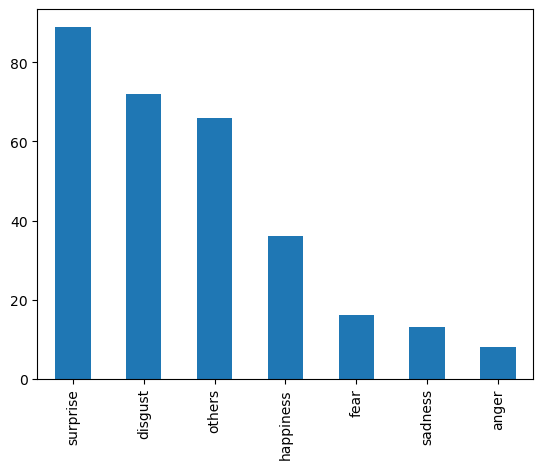

In [5]:
mmew_standard_df_v1.emotion_label.value_counts().plot.bar()

#### 检查onset,apex,offset标注顺序

In [6]:
from merlib.data.utils import check_onset_apex_offset_order
doc=mmew_standard_df_v1
flag,error_clip_id=check_onset_apex_offset_order(doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame)

Every thing is ok!


### 样本数量检查
检查标注的微表情序列，每个序列缺失的帧数

In [7]:
from pathlib import Path
from tqdm import tqdm
from merlib.data.utils import check_sample_lacks

doc=mmew_standard_df_v1
imagefile_template=mmew_info.imagefile_template
raw_data_dir=mmew_info.raw_data_path
video_paths=raw_data_dir / doc['path']
check_sample_lacks(video_paths,doc.unique_path ,doc.start_frame,doc.apex_frame,doc.end_frame,imagefile_template)

everything is ok


,,onset,apex,offset,duration,real_duration,lack_rate,lack_img_id
video_path,clip_id,,,,,,,


### 样本质量检查

能否发现人脸及人脸68个特征点

In [8]:
import openface
from merlib.data import DLIB_FACE_LANDMARK_PATH
align=openface.AlignDlib(DLIB_FACE_LANDMARK_PATH)

doc=mmew_standard_df_v1
data_info=mmew_info
imagefile_template=data_info.imagefile_template
raw_data_dir=data_info.raw_data_path
video_paths=raw_data_dir / doc['path']
for video_path,start,end in zip(video_paths, doc['start_frame'],doc['end_frame']):
    img_path:Path=video_path/ imagefile_template.format(start)
    np_img=np.array(Image.open(img_path))

    bbox=align.getLargestFaceBoundingBox(np_img)
    assert bbox is not None
    landmarks=align.findLandmarks(np_img,bbox)
    assert len(landmarks) ==68

### 统计

In [9]:
from merlib.data.clean_doc import process_MMEW
doc=process_MMEW(mmew_info.doc_path)
assert doc.equals(mmew_standard_df_v1)

In [10]:
standard_df=mmew_standard_df_v1
print(standard_df.info())
standard_df


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           300 non-null    object
 1   unique_path    300 non-null    object
 2   start_frame    300 non-null    int64 
 3   apex_frame     300 non-null    int64 
 4   end_frame      300 non-null    int64 
 5   emotion_label  300 non-null    object
 6   group          300 non-null    int64 
dtypes: int64(4), object(3)
memory usage: 16.5+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,happiness/S01-01-001,happiness/S01-01-001/1_31,1,15,31,happiness,1
1,happiness/S01-01-002,happiness/S01-01-002/1_45,1,15,45,happiness,1
2,happiness/S01-01-003,happiness/S01-01-003/1_23,1,7,23,happiness,1
3,surprise/S01-02-001,surprise/S01-02-001/1_39,1,17,39,surprise,1
4,surprise/S01-02-002,surprise/S01-02-002/1_41,1,6,41,surprise,1
...,...,...,...,...,...,...,...
295,others/S30-04-004,others/S30-04-004/1_31,1,13,31,others,30
296,others/S30-04-005,others/S30-04-005/1_38,1,17,38,others,30
297,fear/S30-05-001,fear/S30-05-001/1_26,1,10,26,fear,30
298,sadness/S30-06-001,sadness/S30-06-001/1_41,1,27,41,sadness,30


#### 视频帧信息及可视化
对每个对象进行可视化，每个对象随机选取一个序列，每个序列随机选取一张。

Image size:1种，{(231, 231)}
Image mode:1种，{'RGB'}
Image format:1种，{'JPEG'}


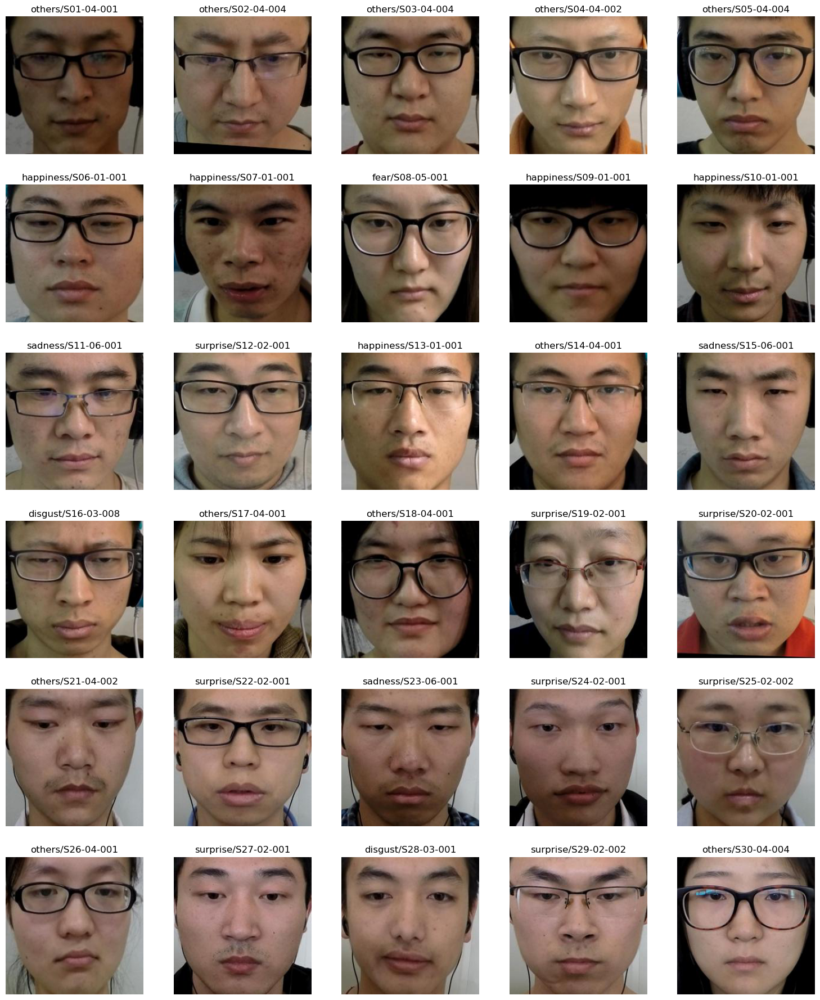

In [11]:
from merlib.data.utils import get_images_info,random_read_img_in_seq,plot_images

res,names=random_read_img_in_seq(standard_df,mmew_info)
imgs=[Image.open(x) for x in res]
get_images_info(imgs)
plot_images(imgs,cols=5,titles=names)

#### 样本标签分布


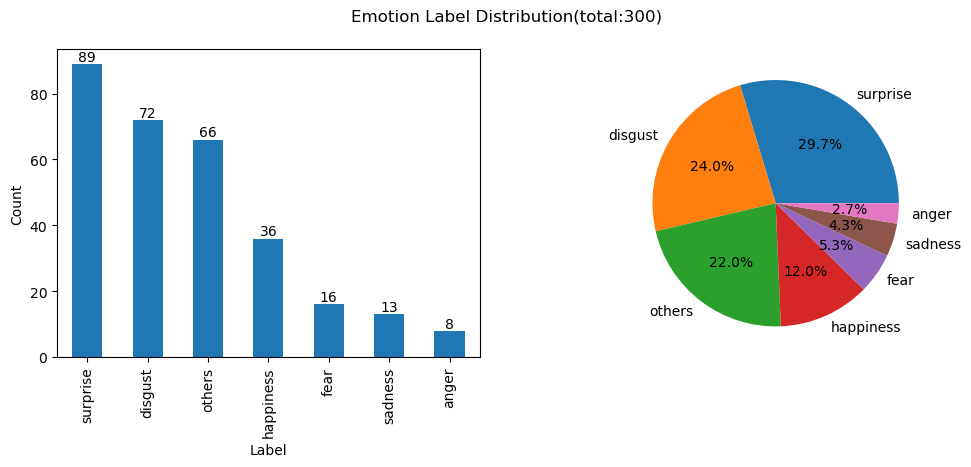

In [12]:
from merlib.data.utils import show_label_distribution,show_duration_len
# show_label_distribution(standard_df)
show_label_distribution(standard_df)

#### 样本帧数量分布

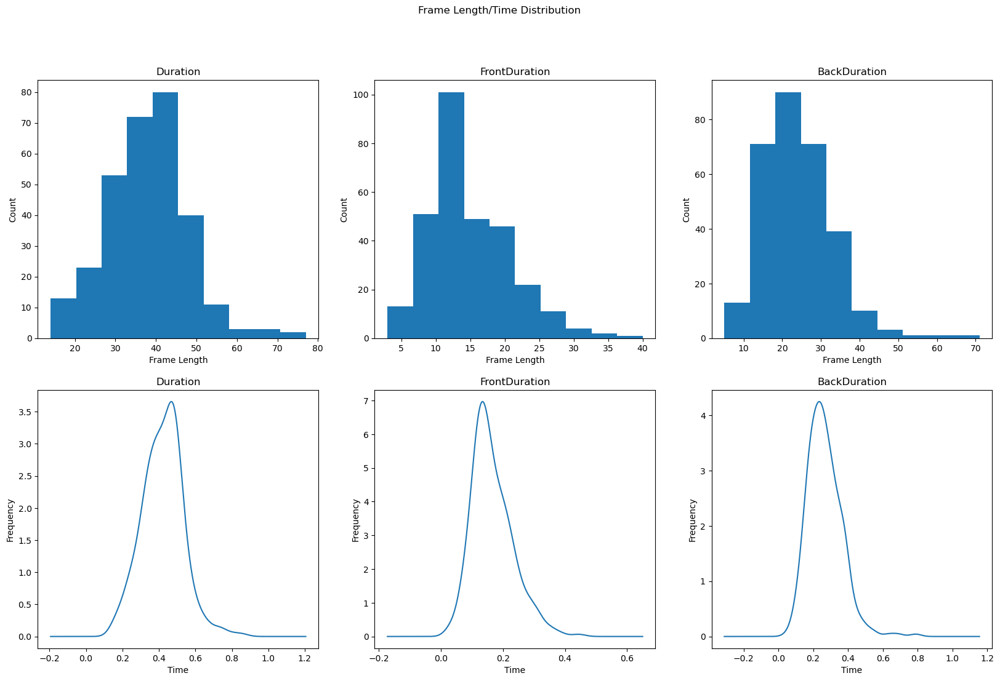

In [13]:
show_duration_len(standard_df,mmew_info.fps)

## CAS(ME)^3

In [2]:
from merlib.data.base import CASME3PartA_info
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path,PurePath

### 简单观察处理excel表格

观察表格信息可以发现数据不存在冗余列，且数据类型比较正确,只是标注问题比较多，如onset和apex标注相同，offset-apex间距过大

In [3]:
casme3_partA=CASME3PartA_info()
doc_path=casme3_partA.doc_path
casme3_partA_df = pd.read_excel(doc_path)
print(casme3_partA_df.info())
casme3_partA_df


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 860 entries, 0 to 859
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Subject          860 non-null    object
 1   Filename         860 non-null    object
 2   Onset            860 non-null    int64 
 3   Apex             860 non-null    int64 
 4   Offset           860 non-null    int64 
 5   AU               860 non-null    object
 6   Objective class  860 non-null    object
 7   emotion          860 non-null    object
dtypes: int64(3), object(5)
memory usage: 53.9+ KB
None


,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion
0,spNO.1,a,355,359,360,5,II,others
1,spNO.1,b,166,175,179,4,III,disgust
2,spNO.1,e,62,68,96,R12,I,others
3,spNO.1,e,96,102,106,R12,I,others
4,spNO.1,f,1421,1426,1440,5,II,others
...,...,...,...,...,...,...,...,...
855,spNO.8,l,2147,2152,2162,14,VII,sad
856,spNO.8,l,2836,2840,2861,14,VII,sad
857,spNO.9,g,234,237,251,4,III,sad
858,spNO.9,g,980,987,1046,4,III,sad


添加video_id和clip_id帮助定位

In [4]:
casme3_partA_df_v1=casme3_partA_df.assign(video_id=lambda x: PurePath() / x['Subject'].map(str) / x['Filename'].str.lower() / 'color')
casme3_partA_df_v1['clip_id']=casme3_partA_df_v1['video_id'] / casme3_partA_df_v1.apply(lambda row:'{}_{}'.format(row['Onset'],row['Offset']),axis=1)
casme3_partA_df_v1.head()

,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,video_id,clip_id
0,spNO.1,a,355,359,360,5,II,others,spNO.1/a/color,spNO.1/a/color/355_360
1,spNO.1,b,166,175,179,4,III,disgust,spNO.1/b/color,spNO.1/b/color/166_179
2,spNO.1,e,62,68,96,R12,I,others,spNO.1/e/color,spNO.1/e/color/62_96
3,spNO.1,e,96,102,106,R12,I,others,spNO.1/e/color,spNO.1/e/color/96_106
4,spNO.1,f,1421,1426,1440,5,II,others,spNO.1/f/color,spNO.1/f/color/1421_1440


在可视化样本标签分布时发现，存在Others,Others两个重叠但不同门的类

Text(0.5, 1.0, 'after updated')

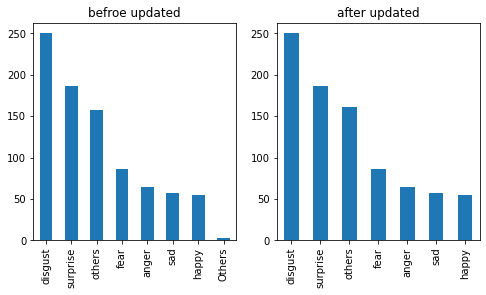

In [5]:
_,ax=plt.subplots(1,2,figsize=(8,4)) #figsize 的默认值是 (6.4, 4.8)，其中第一个数是宽度，第二个数是高度，单位是英寸。
casme3_partA_df_v1['emotion'].value_counts().plot.bar(ax=ax[0])

casme3_partA_df_v2=casme3_partA_df_v1.assign(emotion= casme3_partA_df_v1['emotion'].map(str.lower))# 将Others替换others) 
casme3_partA_df_v2['emotion'].value_counts().plot.bar(ax=ax[1])
ax[0].set_title('befroe updated')
ax[1].set_title('after updated')


在可视化样本帧数量长度分布时发现分布异常，具体来说，onset-apex分布正常，而apex-offset之间偏移量太大，导致许多微表情帧数大于15帧，即0.5s(FPS=30).根据建议取(apex+(apex-onset)) 代替原offset标注。https://github.com/jingtingEmmaLi/CAS-ME-3/issues/4

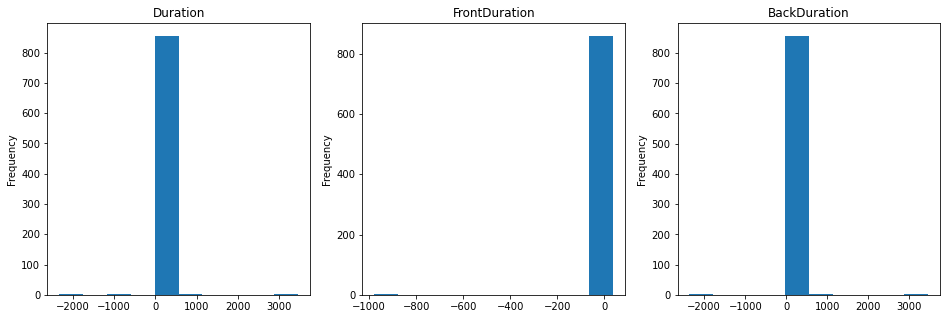

In [6]:
def show_duration_len(dataframe):
    dataframe['Duration']=(dataframe['Offset']-dataframe['Onset']+1)
    dataframe['FrontDuration']=(dataframe['Apex']-dataframe['Onset']+1)
    dataframe['BackDuration']=(dataframe['Offset']-dataframe['Apex']+1)
    fig, ax = plt.subplots(1,3, figsize=(16, 5))
    ax1=dataframe['Duration'].plot.hist(ax=ax[0])
    ax2=dataframe['FrontDuration'].plot.hist(ax=ax[1])
    ax3=dataframe['BackDuration'].plot.hist(ax=ax[2])
    titles=['Duration','FrontDuration','BackDuration']
    for i in range(3):
        ax[i].set_title(titles[i])
    plt.show()

show_duration_len(casme3_partA_df_v2)

上图中出现负数，说明Onset、Apex、Offset帧标注存在误差(前后顺序错误)

<span style="color:red">结果显示 Filename为 spNO.149_[112,358] Apex帧标注错误，spNO.216_d[3647,2694]、spNO.40_e[1812,0]、[2327,0]标注错误</span>

In [8]:
def check_onset_apex_offset_order(clipids,onsets,apexs,offsets):
    return_flag=True
    error_clip_ids=[]
    for clip_id, start,apex,end in zip( clipids,onsets,apexs,offsets):
        if  start<= apex<=end:
            pass
        else:
            error_clip_ids.append(clip_id)
            return_flag=False
            print(  "{} apex-{} is not in [{},{}]".format(clip_id,apex,start,end))
    if return_flag:
        print("Every thing is ok!")
    return return_flag,error_clip_ids
doc=casme3_partA_df_v2
flag,error_clip_ids=check_onset_apex_offset_order(doc['clip_id'] ,doc['Onset'],doc['Apex'],doc['Offset'])

spNO.149/d/color/112_358 apex-83 is not in [112,358]
spNO.216/d/color/3647_2694 apex-2668 is not in [3647,2694]
spNO.40/e/color/1812_0 apex-1824 is not in [1812,0]
spNO.40/e/color/2327_0 apex-2363 is not in [2327,0]


In [9]:
# 查看错误标注
selected_rows=casme3_partA_df_v2['clip_id'].isin(error_clip_ids)
casme3_partA_df_v2[selected_rows] 

,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,video_id,clip_id,Duration,FrontDuration,BackDuration
128,spNO.149,d,112,83,358,T28+14,VII,fear,spNO.149/d/color,spNO.149/d/color/112_358,247,-28,276
749,spNO.216,d,3647,2668,2694,38,VII,others,spNO.216/d/color,spNO.216/d/color/3647_2694,-952,-978,27
796,spNO.40,e,1812,1824,0,18,VII,others,spNO.40/e/color,spNO.40/e/color/1812_0,-1811,13,-1823
798,spNO.40,e,2327,2363,0,14,VII,others,spNO.40/e/color,spNO.40/e/color/2327_0,-2326,37,-2362


Every thing is ok!


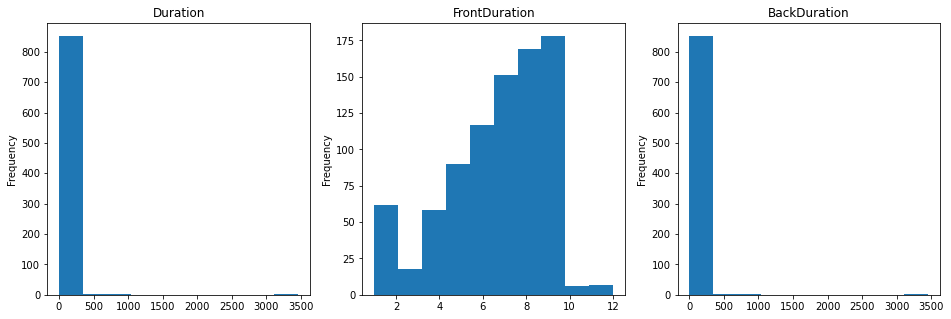

In [10]:
# 错误标注删除
casme3_partA_df_v3 = casme3_partA_df_v2.drop(casme3_partA_df_v2[selected_rows].index,axis=0).reset_index(drop=True)

doc=casme3_partA_df_v3
check_onset_apex_offset_order(doc['clip_id'] ,doc['Onset'],doc['Apex'],doc['Offset'])

show_duration_len(casme3_partA_df_v3)

上图中显示存在持续周期较大值，如onset-offset有超过3500帧的，这里通过moffset=apex+(apex-onset)代替原本Offset标注（仅处理原序列长度大于0.5s的样本），再设置阈值N处理微表情持续周期大于0.5s的情况

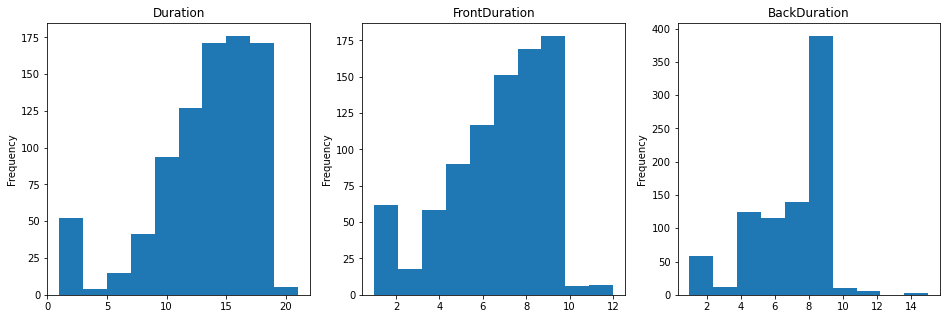

In [11]:
time_fps2frames=lambda time,fps:int(time*fps)
N=time_fps2frames(0.5,30) 
new_Offset=casme3_partA_df_v3.apply(lambda x: (x['Apex']+x['Apex']-x['Onset']) if x['Duration']>N else x['Offset'],axis=1 )
casme3_partA_df_v4=casme3_partA_df_v3.assign(Offset=new_Offset)
show_duration_len(casme3_partA_df_v4)

正如所见，由于onset-apex之间存在大于0.25ms的数据，导致出现120帧的序列，下面设定阈值进行筛选

小于等于0.5s的序列 680
小于等于0.55s的序列 680
小于等于0.6s的序列 851
所有的序列 856


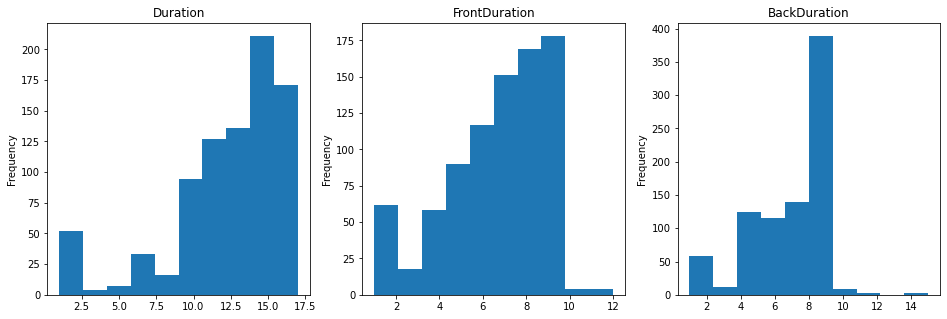

In [12]:

print( '小于等于0.5s的序列',casme3_partA_df_v4[casme3_partA_df_v4['Duration']<=time_fps2frames(0.5,30)].__len__())
print( '小于等于0.55s的序列',casme3_partA_df_v4[casme3_partA_df_v4['Duration']<=time_fps2frames(0.55,30)].__len__())
print( '小于等于0.6s的序列',casme3_partA_df_v4[casme3_partA_df_v4['Duration']<=time_fps2frames(0.6,30)].__len__())
print( '所有的序列',casme3_partA_df_v4['Duration'].__len__())

N=time_fps2frames(0.6,30) 
casme3_partA_df_v5=casme3_partA_df_v4[casme3_partA_df_v4['Duration']<=N].reset_index(drop=True)
show_duration_len(casme3_partA_df_v5)


同时，存在Onset帧与Apex帧相同的数据，它们的offset往往偏移很大，经过上述的处理，导致它们Onset	Apex	Offset	相同。它们可以被视为特殊情况暂不处理

In [13]:
A=casme3_partA_df_v5
print( len(casme3_partA_df_v5[(A['Onset']==A['Apex'])]))
casme3_partA_df_v5[(A['Onset']==A['Apex'])]

55


,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,video_id,clip_id,Duration,FrontDuration,BackDuration
34,spNO.11,f,13,13,13,2+1,II,others,spNO.11/f/color,spNO.11/f/color/13_40,1,1,1
68,spNO.142,i,11,11,11,14,VII,anger,spNO.142/i/color,spNO.142/i/color/11_83,1,1,1
73,spNO.142,j,7,7,7,25+12,VII,happy,spNO.142/j/color,spNO.142/j/color/7_42,1,1,1
76,spNO.143,l,5,5,5,14,VII,others,spNO.143/l/color,spNO.143/l/color/5_30,1,1,1
283,spNO.168,a,4,4,4,14,VII,others,spNO.168/a/color,spNO.168/a/color/4_34,1,1,1
284,spNO.169,a,8,8,8,R2,VII,others,spNO.169/a/color,spNO.169/a/color/8_61,1,1,1
287,spNO.169,c,4,4,4,4,III,others,spNO.169/c/color,spNO.169/c/color/4_73,1,1,1
356,spNO.175,f,7,7,7,14,VII,fear,spNO.175/f/color,spNO.175/f/color/7_42,1,1,1
367,spNO.179,b,7,7,7,1,V,disgust,spNO.179/b/color,spNO.179/b/color/7_57,1,1,1
409,spNO.184,i,8,8,8,18,VII,others,spNO.184/i/color,spNO.184/i/color/8_23,1,1,1


然后，根据作者的在异常文件中的提示，有15个样本脸部存在遮挡，进行剔除；有一个样本onset apex帧标注为0,它们的值将被加1。

In [14]:
error_samples="/home/neu-wang/mby/database/CASME3-PartA/CAS-ME-3-supply-update_2023_3_3/exception/casme3_partA_error_list_ZhouJu.xlsx"
error_sample_doc=pd.read_excel(error_samples)
error_sample_doc

,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,问题,我们目前的解决方法,图片(调整前),图片(调整后)
0,spNO.2,e,138,143,148,1,V,surprise,apex脸部被手遮盖,去除该张,NaN,NaN
1,spNO.145,g,150,156,158,5,II,surprise,apex脸部被手遮盖,去除该张,NaN,NaN
2,spNO.146,a,530,536,561,24,VII,disgust,apex眉毛、额头被遮盖,去除该张,NaN,NaN
3,spNO.147,d,1146,1150,1163,5,II,surprise,apex下巴被遮盖,去除该张,NaN,NaN
4,spNO.147,e,1058,1069,1071,5,II,others,apex脸部被手遮盖,去除该张,NaN,NaN
5,spNO.155,d,5,12,136,14,VII,others,apex嘴部、下巴被手遮盖,去除该张,NaN,NaN
6,spNO.179,b,7,7,57,1,V,disgust,apex嘴部、下巴被手遮盖,去除该张,NaN,NaN
7,spNO.200,b,518,524,533,9,IV,fear,apex嘴部、下巴被遮盖,去除该张,NaN,NaN
8,spNO.204,a,606,612,635,4,III,disgust,apex下巴被遮盖,去除该张,NaN,NaN
9,spNO.206,a,10,17,24,1,V,others,apex脸部被手遮盖,去除该张,NaN,NaN


删除或修改样本

In [23]:
error_sample_doc=error_sample_doc.assign(video_id=lambda x: PurePath() / x['Subject'].map(str) / x['Filename'].str.lower() / 'color')
error_sample_doc['clip_id']=error_sample_doc['video_id'] / error_sample_doc.apply(lambda row:'{}_{}'.format(row['Onset'],row['Offset']),axis=1)
selected_rows=casme3_partA_df_v5['clip_id'].isin(error_sample_doc['clip_id'])
casme3_partA_df_v5[selected_rows].reset_index()

,index,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,video_id,clip_id,Duration,FrontDuration,BackDuration
0,90,spNO.145,g,150,156,158,5,II,surprise,spNO.145/g/color,spNO.145/g/color/150_158,9,7,3
1,92,spNO.146,a,530,536,542,24,VII,disgust,spNO.146/a/color,spNO.146/a/color/530_561,13,7,7
2,94,spNO.147,d,1146,1150,1154,5,II,surprise,spNO.147/d/color,spNO.147/d/color/1146_1163,9,5,5
3,95,spNO.147,e,1058,1069,1071,5,II,others,spNO.147/e/color,spNO.147/e/color/1058_1071,14,12,3
4,173,spNO.155,d,5,12,19,14,VII,others,spNO.155/d/color,spNO.155/d/color/5_136,15,8,8
5,367,spNO.179,b,7,7,7,1,V,disgust,spNO.179/b/color,spNO.179/b/color/7_57,1,1,1
6,554,spNO.2,e,138,143,148,1,V,surprise,spNO.2/e/color,spNO.2/e/color/138_148,11,6,6
7,559,spNO.200,b,518,524,530,9,IV,fear,spNO.200/b/color,spNO.200/b/color/518_533,13,7,7
8,593,spNO.204,a,606,612,618,4,III,disgust,spNO.204/a/color,spNO.204/a/color/606_635,13,7,7
9,601,spNO.206,a,10,17,24,1,V,others,spNO.206/a/color,spNO.206/a/color/10_24,15,8,8


In [16]:

casme3_partA_df_v6=casme3_partA_df_v5.drop(casme3_partA_df_v5[selected_rows].index).reset_index(drop=True)
casme3_partA_df_v6

,Subject,Filename,Onset,Apex,Offset,AU,Objective class,emotion,video_id,clip_id,Duration,FrontDuration,BackDuration
0,spNO.1,a,355,359,360,5,II,others,spNO.1/a/color,spNO.1/a/color/355_360,6,5,2
1,spNO.1,b,166,175,179,4,III,disgust,spNO.1/b/color,spNO.1/b/color/166_179,14,10,5
2,spNO.1,e,62,68,74,R12,I,others,spNO.1/e/color,spNO.1/e/color/62_96,13,7,7
3,spNO.1,e,96,102,106,R12,I,others,spNO.1/e/color,spNO.1/e/color/96_106,11,7,5
4,spNO.1,f,1421,1426,1431,5,II,others,spNO.1/f/color,spNO.1/f/color/1421_1440,11,6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
830,spNO.8,l,2147,2152,2157,14,VII,sad,spNO.8/l/color,spNO.8/l/color/2147_2162,11,6,6
831,spNO.8,l,2836,2840,2844,14,VII,sad,spNO.8/l/color,spNO.8/l/color/2836_2861,9,5,5
832,spNO.9,g,234,237,240,4,III,sad,spNO.9/g/color,spNO.9/g/color/234_251,7,4,4
833,spNO.9,g,980,987,994,4,III,sad,spNO.9/g/color,spNO.9/g/color/980_1046,15,8,8


将 casme3_partA_dataframe 处理得到标准的微表情df对象,方便一致性处理数据集

In [17]:
from data.clean_doc import make_dataframe

from pathlib import PurePath

doc=casme3_partA_df_v6
clip_paths = PurePath() / doc['Subject'] / doc['Filename'].str.lower()  /'color'

standard_df=make_dataframe(
        path=clip_paths,
        start_frame=doc['Onset'],
        apex_frame=doc['Apex'],
        end_frame=doc['Offset'],
        emotion_label=doc['emotion'],
        group=doc['Subject'])

assert (standard_df.apex_frame<=standard_df.end_frame).all() and (standard_df.apex_frame>=standard_df.start_frame).all()
print(standard_df.info())
standard_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 835 entries, 0 to 834
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   path           835 non-null    object
 1   unique_path    835 non-null    object
 2   start_frame    835 non-null    int64 
 3   apex_frame     835 non-null    int64 
 4   end_frame      835 non-null    int64 
 5   emotion_label  835 non-null    object
 6   group          835 non-null    object
dtypes: int64(3), object(4)
memory usage: 45.8+ KB
None


,path,unique_path,start_frame,apex_frame,end_frame,emotion_label,group
0,spNO.1/a/color,spNO.1/a/color/355_360,355,359,360,others,spNO.1
1,spNO.1/b/color,spNO.1/b/color/166_179,166,175,179,disgust,spNO.1
2,spNO.1/e/color,spNO.1/e/color/62_74,62,68,74,others,spNO.1
3,spNO.1/e/color,spNO.1/e/color/96_106,96,102,106,others,spNO.1
4,spNO.1/f/color,spNO.1/f/color/1421_1431,1421,1426,1431,others,spNO.1
...,...,...,...,...,...,...,...
830,spNO.8/l/color,spNO.8/l/color/2147_2157,2147,2152,2157,sad,spNO.8
831,spNO.8/l/color,spNO.8/l/color/2836_2844,2836,2840,2844,sad,spNO.8
832,spNO.9/g/color,spNO.9/g/color/234_240,234,237,240,sad,spNO.9
833,spNO.9/g/color,spNO.9/g/color/980_994,980,987,994,sad,spNO.9


### 样本数量检查
检查标注的微表情序列，每个序列缺失的帧数

In [22]:
from pathlib import Path
from tqdm import tqdm
# import pandas as wpd
# #显示所有列
# wpd.set_option('display.max_columns', None)
# #显示所有行
# wpd.set_option('display.max_rows', None)
# #设置value的显示长度为100，默认为50
# wpd.set_option('max_colwidth',None)
import itertools
from collections import defaultdict

def check_sample_lacks(video_paths,clipids,onsets,apexs,offsets,imagefile_template ):
    def list_to_str(nums):
        res = ""
        i = 0
        while i < len(nums):
            start_num = nums[i]
            end_num = start_num
            while i < len(nums) - 1 and nums[i + 1] == end_num + 1:
                end_num = nums[i + 1]
                i += 1
            if start_num != end_num:
                res += str(start_num) + "-" + str(end_num)
            else:
                res += str(start_num)
            if i < len(nums) - 1:
                res += ","
            i += 1
        return res

    df=pd.DataFrame({
        'video_path':[],
        'clip_id':[],
        'onset':[],
        'apex':[],
        'offset':[],
        'duration':[],
        'real_duration':[],
        'lack_rate':[],
        'lack_img_id':[]
    })

    for video_path,clip_id,start,apex,end in zip(video_paths,clipids,onsets,apexs,offsets):
        row={
        'video_path':video_path,
        'clip_id':clip_id,
        'onset': True,
        'apex':True,
        'offset':True,
        'duration':end-start+1,
        'real_duration':None,
        'lack_rate':None,
        'lack_img_id':[]
    }
        assert start<=end,clip_id
        # 检测onset,apex,offset帧是否存在
        img_path:Path=video_path/ imagefile_template.format(start)
        if not img_path.exists():
            row['onset']=False
        img_path:Path=video_path/ imagefile_template.format(apex)
        if not img_path.exists():
            row['apex']=False
        img_path:Path=video_path/ imagefile_template.format(end)
        if not img_path.exists():
            row['offset']=False
        counter=itertools.count()
        for z in range(start,end+1):
            img_path:Path=video_path/ imagefile_template.format(z)
            if  img_path.exists():
                next(counter)
                row['lack_img_id'].append(z)
                
        row['real_duration']=next(counter)
        row['lack_rate']=1- row['real_duration']/row['duration']
        row['lack_img_id']=list_to_str(row['lack_img_id'])
        if row['real_duration']<row['duration']:
            df.loc[len(df)] = row

    return df.set_index(['video_path','clip_id'])
    
data_info=casme3_partA
doc=standard_df
imagefile_template=data_info.imagefile_template
raw_data_dir=data_info.raw_data_path
video_paths=raw_data_dir / doc['path']
lack_df=check_sample_lacks(video_paths,doc['unique_path'],doc['start_frame'],doc['apex_frame'],doc['end_frame'],imagefile_template)    
total_imgs=sum(standard_df['end_frame']-standard_df['start_frame']+1)
lack_imgs=sum(lack_df['duration']-lack_df['real_duration'])
print("总图片{}，丢失图片 {}，丢失率{:.2%}，集中在 {}个视频，{}个样本中。".format(total_imgs,lack_imgs,lack_imgs/total_imgs,len(lack_df.index.levels[0]),len(lack_df.index.levels[1])))
lack_df

总图片10391，丢失图片 178，丢失率1.71%，集中在 40个视频，61个样本中。


onset  apex  \
video_path                           clip_id                                   
/data/CASME3/part_A/spNO.170/k/color spNO.170/k/color/868_878     True  True   
/data/CASME3/part_A/spNO.171/e/color spNO.171/e/color/2403_2411   True  True   
                                     spNO.171/e/color/2825_2829   True  True   
/data/CASME3/part_A/spNO.171/f/color spNO.171/f/color/668_680     True  True   
                                     spNO.171/f/color/2151_2165   True  True   
...                                                                ...   ...   
/data/CASME3/part_A/spNO.215/f/color spNO.215/f/color/1692_1706   True  True   
/data/CASME3/part_A/spNO.215/i/color spNO.215/i/color/549_563     True  True   
/data/CASME3/part_A/spNO.215/j/color spNO.215/j/color/463_467     True  True   
/data/CASME3/part_A/spNO.215/k/color spNO.215/k/color/1505_1519   True  True   
/data/CASME3/part_A/spNO.215/l/color spNO.215/l/color/1613_1623   True  True   

                                                                 offset  \
video_path                           clip_id                              
/data/CASME3/part_A/spNO.170/k/color spNO.170/k/color/868_878      True   
/data/CASME3/part_A/spNO.171/e/color spNO.171/e/color/2403_2411   False   
                                     spNO.171/e/color/2825_2829   False   
/data/CASME3/part_A/spNO.171/f/color spNO.171/f/color/668_680     False   
                                     spNO.171/f/color/2151_2165   False   
...                                                                 ...   
/data/CASME3/part_A/spNO.215/f/color spNO.215/f/color/1692_1706    True   
/data/CASME3/part_A/spNO.215/i/color spNO.215/i/color/549_563      True   
/data/CASME3/part_A/spNO.215/j/color spNO.215/j/color/463_467     False   
/data/CASME3/part_A/spNO.215/k/color spNO.215/k/color/1505_1519    True   
/data/CASME3/part_A/spNO.215/l/color spNO.215/l/color/1613_1623    True   

                                                                 duration  \
video_path                           clip_id                                
/data/CASME3/part_A/spNO.170/k/color spNO.170/k/color/868_878          11   
/data/CASME3/part_A/spNO.171/e/color spNO.171/e/color/2403_2411         9   
                                     spNO.171/e/color/2825_2829         5   
/data/CASME3/part_A/spNO.171/f/color spNO.171/f/color/668_680          13   
                                     spNO.171/f/color/2151_2165        15   
...                                                                   ...   
/data/CASME3/part_A/spNO.215/f/color spNO.215/f/color/1692_1706        15   
/data/CASME3/part_A/spNO.215/i/color spNO.215/i/color/549_563          15   
/data/CASME3/part_A/spNO.215/j/color spNO.215/j/color/463_467           5   
/data/CASME3/part_A/spNO.215/k/color spNO.215/k/color/1505_1519        15   
/data/CASME3/part_A/spNO.215/l/color spNO.215/l/color/1613_1623        11   

                                                                 real_duration  \
video_path                           clip_id                                     
/data/CASME3/part_A/spNO.170/k/color spNO.170/k/color/868_878                6   
/data/CASME3/part_A/spNO.171/e/color spNO.171/e/color/2403_2411              5   
                                     spNO.171/e/color/2825_2829              3   
/data/CASME3/part_A/spNO.171/f/color spNO.171/f/color/668_680                8   
                                     spNO.171/f/color/2151_2165              8   
...                                                                        ...   
/data/CASME3/part_A/spNO.215/f/color spNO.215/f/color/1692_1706             13   
/data/CASME3/part_A/spNO.215/i/color spNO.215/i/color/549_563               12   
/data/CASME3/part_A/spNO.215/j/color spNO.215/j/color/463_467                3   
/data/CASME3/part_A/spNO.215/k/color spNO.215/k/color/1505_1519             12   
/data/CASME3/part_A/spNO.215/l/color spNO.215/l/color/1613_162

### 样本质量检查

能否发现人脸及人脸68个特征点

In [63]:
import openface
from data import DLIB_FACE_LANDMARK_PATH
align=openface.AlignDlib(DLIB_FACE_LANDMARK_PATH)
doc=standard_df
data_info=casme3_partA

raw_data_dir=data_info.raw_data_path
imagefile_template=data_info.imagefile_template

video_paths=raw_data_dir / doc['path']
def check_faces_is_detected(video_paths,clip_ids,onsets,offsets):
    return_flag = True
    for video_path,unipath,start,end in zip(video_paths,clip_ids , onsets,offsets):
        img_path:Path=video_path/ imagefile_template.format(start)
        if not img_path.exists(): continue
        np_img=np.array(Image.open(img_path))

        bbox=align.getLargestFaceBoundingBox(np_img)
        if  bbox is  None:
            print('bbox is None:',unipath)
            continue
        landmarks=align.findLandmarks(np_img,bbox)
        if  len(landmarks) !=68:
            print('(landmarks) !=68:',unipath)
    return return_flag

check_faces_is_detected(video_paths,doc['path'], doc['start_frame'],doc['end_frame'])

True

### 可视化样本
对每个对象进行可视化，每个对象随机选取一个序列，每个序列随机选取一张。

Image size:32种，{(641, 496), (444, 445), (445, 444), (533, 386), (533, 325), (533, 444), (641, 639), (641, 532), (445, 416), (769, 495), (536, 503), (445, 367), (444, 441), (536, 414), (536, 533), (536, 536), (536, 475), (445, 342), (769, 622), (536, 386), (536, 444), (712, 603), (533, 503), (641, 567), (641, 460), (444, 342), (533, 414), (533, 533), (372, 372), (641, 603), (533, 536), (533, 475)}
Image mode:1种，{'RGB'}
Image format:1种，{'JPEG'}


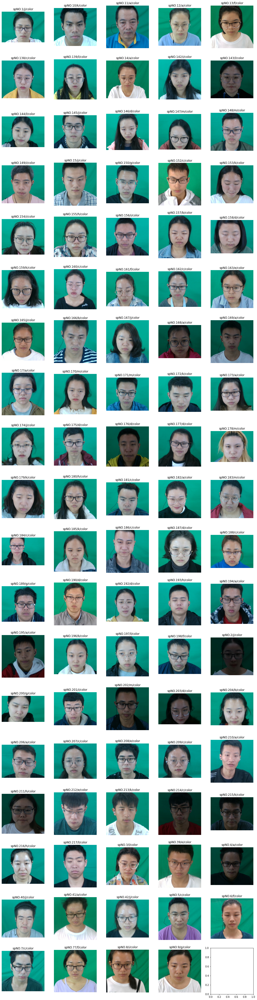

In [70]:
def random_read_img_in_seq(standard_df:pd.DataFrame,dataset_info):
    import random

    # 指定随机种子为10
    random.seed(10)

    raw_data_dir=dataset_info.raw_data_path
    doc=standard_df
    imagefile_template=dataset_info.imagefile_template
    res=[]
    sample_df = doc.groupby('group').apply(lambda x: x.sample(n=1, random_state=42))
    doc=sample_df

    names=[]
    for video_path,start,end in zip(doc['path'], doc['start_frame'],doc['end_frame']):
        while True:
            i=random.choice(range(start,end+1))
            img_path:Path=raw_data_dir/video_path/ imagefile_template.format(i)
            if img_path.exists():break
        res.append(img_path)
        names.append('{}'.format(video_path))
    return res,names
import matplotlib.pyplot as plt
import math

# 将多张图片展示在一个网格中，每行尽量占满一行
def plot_images(images, cols=5, cmap='gray', titles=None):
    rows = math.ceil(len(images) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3))
    fig.tight_layout(pad=0.5)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            img_height, img_width = images[i].size
            new_width = fig.get_figwidth() * fig.dpi / cols
            new_height = (new_width / img_width) * img_height
            ax.imshow(images[i], cmap=cmap)
            if titles is not None:
                ax.set_title(titles[i])
            ax.axis('off')
            ax.set_aspect('equal')
            # ax.set_ylim(2*new_height, 0)  # 图片默认y轴方向向下，需要翻转

res,names=random_read_img_in_seq(standard_df,casme3_partA)
imgs=[Image.open(x) for x in res]
plot_images(imgs,cols=5,titles=names)

def get_images_info(imgs:List[Image]):
    # 输出图像尺寸和色彩模式
    query_size=set()
    query_mode=set()
    query_format=set()
    for q in imgs:
        query_size.add(q.size)
        query_mode.add(q.mode)
        query_format.add(q.format)
    print('Image size:{}种，{}'.format(len(query_size),query_size))
    print('Image mode:{}种，{}'.format(len(query_mode),query_mode)) # L灰度，单通道；RGB,彩色，三通道
    print('Image format:{}种，{}'.format(len(query_format),query_format)) # L灰度，单通道；RGB,彩色，三通道

### 统计样本标签分布
样本分布为：negative:73, 占比 43.98%, positive:51, 占比 30.72%, surprise:42, 占比 25.30%

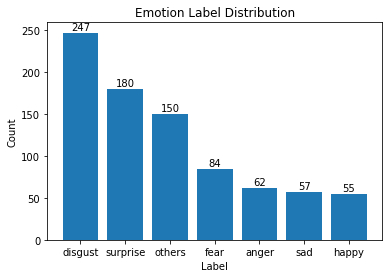

disgust:247, 占比 29.58%
surprise:180, 占比 21.56%
others:150, 占比 17.96%
fear:84, 占比 10.06%
anger:62, 占比 7.43%
sad:57, 占比 6.83%
happy:55, 占比 6.59%


In [71]:
label_counts=standard_df['emotion_label'].value_counts()
labels=label_counts.index
label_count=label_counts.values
# 绘制柱状图
plt.bar(labels,label_count)

# 设置标题和轴标签
plt.title('Emotion Label Distribution')
plt.xlabel('Label')
plt.ylabel('Count')
# 在柱子上方添加标签
for i in range(len(labels)):
    plt.text(i, label_count[i]+1, str(label_count[i]), ha='center', va='bottom')
# 显示图形
plt.show()
for i in range(len(label_counts)):
    print('{}:{}, 占比 {:.2%}'.format(labels[i],label_count[i],label_count[i]/sum(label_count)))

### 统计样本帧数量分布


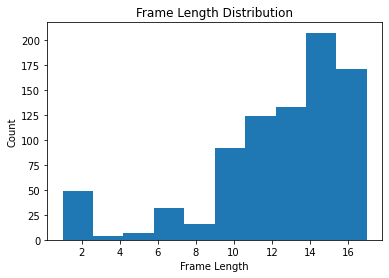

In [73]:

frame_len=(standard_df['end_frame']-standard_df['start_frame']+1)
plt.hist(frame_len)
# 设置图表标题和轴标签
plt.title('Frame Length Distribution')
plt.xlabel('Frame Length')
plt.ylabel('Count')

# 显示图表
plt.show()

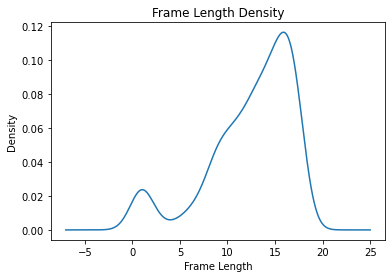

count    600.000000
mean      12.468333
std        4.430393
min        1.000000
25%       10.000000
50%       13.000000
75%       16.000000
max       17.000000
dtype: float64

In [46]:
frame_len.plot.kde()
# 设置图表标题和轴标签
plt.title('Frame Length Density')
plt.xlabel('Frame Length')
plt.ylabel('Density')

# 显示图表
plt.show()
frame_len.describe()